# Trabalho Prático 2 - Aprendizado de Máquina

Maria Luiza Leão Silva - 2020100953

**Introdução**

No campo do aprendizado de máquina, a capacidade de analisar e extrair insights de conjuntos de dados complexos é fundamental. Este trabalho se concentra em explorar e aplicar técnicas de aprendizado supervisionado e não-supervisionado nos dados de estatísticas de novatos da NBA. O conjunto de dados compreende 1.340 observações, cada uma caracterizada por uma variedade de atributos, desde estatísticas de desempenho individual até métricas de eficiência.

O objetivo principal deste estudo é empregar dois algoritmos distintos: o k-Nearest Neighbors (kNN) e o k-Means. Ambos são pilares essenciais do aprendizado de máquina e são usados em diferentes contextos.

O algoritmo k-Nearest Neighbors é um método de classificação baseado na proximidade dos pontos de dados no espaço de atributos. Ele será explorado para prever se a carreira de um jogador na NBA excederá cinco anos, utilizando as estatísticas de novatos como base para essa previsão.

Por outro lado, o k-Means é um algoritmo de agrupamento não-supervisionado, utilizado para segmentar os jogadores novatos em grupos com base em características semelhantes. Essa técnica nos permitirá identificar padrões intrínsecos nos dados, auxiliando na compreensão de diferentes perfis de jogadores.

Ao longo deste trabalho, serão discutidos os métodos de preparação dos dados, a aplicação dos algoritmos kNN e k-Means, a análise dos resultados obtidos e suas implicações no contexto da NBA. Esta abordagem prática busca não apenas aplicar técnicas de aprendizado de máquina, mas também extrair insights valiosos para compreender melhor os fatores determinantes para o sucesso de um novato na liga de basquete mais prestigiada do mundo.

In [109]:
import pandas as pd
import numpy as np
import sklearn.metrics as metrics
import sklearn.neighbors as neighbors
import sklearn.cluster as cluster
import sklearn.decomposition as decomposition
import matplotlib.pyplot as plt
import seaborn as sns
import scipy

## Dataset

### Descrição

Os dados consistem atributos sobre os jogadores novatos e oferecem uma ampla gama de informações sobre o desempenho dos mesmos, desde sua pontuação até seu jogo defensivo e eficiência nos arremessos, e serão utilizados para a análise e aplicação dos algoritmos de aprendizado de máquina neste trabalho.

In [110]:
# Importing the train and test dataset
trainingData = pd.read_csv('nba_treino.csv')
testingData = pd.read_csv('nba_teste.csv')

Classe player foi criada para facilitar a manipulação dos dados e a representação dos jogadores, principalmente no algoritmo KNN.

In [111]:
class Player():
    def __init__(self, data, classification = None) -> None:
        self.data = np.array(data)
        self.classification = classification
        
    def distance(self, other):
        return np.linalg.norm(self.data - other.data)

In [113]:
# initializing the players from the train and test dataset

lines = trainingData.shape[0]
playersTrain = []     
for i in range(lines):
    player = Player(trainingData.iloc[i, 0:-1], classification = trainingData.iloc[i, -1])
    playersTrain.append(player)    

lines = testingData.shape[0]
playersTest = []     
for i in range(lines):
    player = Player(testingData.iloc[i, 0:-1], classification = testingData.iloc[i, -1])
    playersTest.append(player)
real_classifications = testingData.iloc[:, -1].to_numpy()

### Pre processamento

A normalização dos dados é importante porque:

**Escalas diferentes:** Atributos podem ter escalas e unidades variadas, afetando a interpretação do algoritmo.

**Impacto nas distâncias:** Em algoritmos como kNN, diferenças de escala podem distorcer o cálculo das distâncias entre os dados.

**Convergência e estabilidade:** A normalização ajuda na convergência mais rápida de algoritmos e torna o modelo mais estável e menos sensível a variações de escala.

**Equilíbrio nos dados:** Garante que todos os atributos tenham pesos semelhantes durante o aprendizado do modelo, evitando viés em direção a atributos com magnitudes maiores.

Em suma, a normalização torna os dados comparáveis e permite que os algoritmos considerem igualmente a contribuição de cada atributo durante a modelagem. Isso é crucial para algoritmos sensíveis à escala dos dados, como kNN e k-Means.

In [114]:
# Data normalization using the max value of each column

for column in trainingData.columns[0:-1]: 
    trainingData[column] = trainingData[column]  / trainingData[column].abs().max()

for column in testingData.columns[0:-1]: 
    testingData[column] = testingData[column]  / testingData[column].abs().max()

Agora, podemos observar a distribuição dos dados após a normalização. Temos os graficos de duspersão das variáveis emparelhadas duas a duas na froma de uma grade. Já nnas diagonais, temos os histogramas de cada variável.

Isso permite uma visualização rápida das relações entre pares de variáveis e das distribuições individuais de cada variável. Podemos observar que alguns dos atributos podem apresentar algum tipo de relação linear, como é o caso de AST e TOV, STL e BLK, e TRB e AST, essa hipotese inicial vem do plot qua chega a formar algo semelhante a uma reta. Já outros dados, possuem relações mais dispersas, como é o caso do GP e MIN ou STL e FG%.

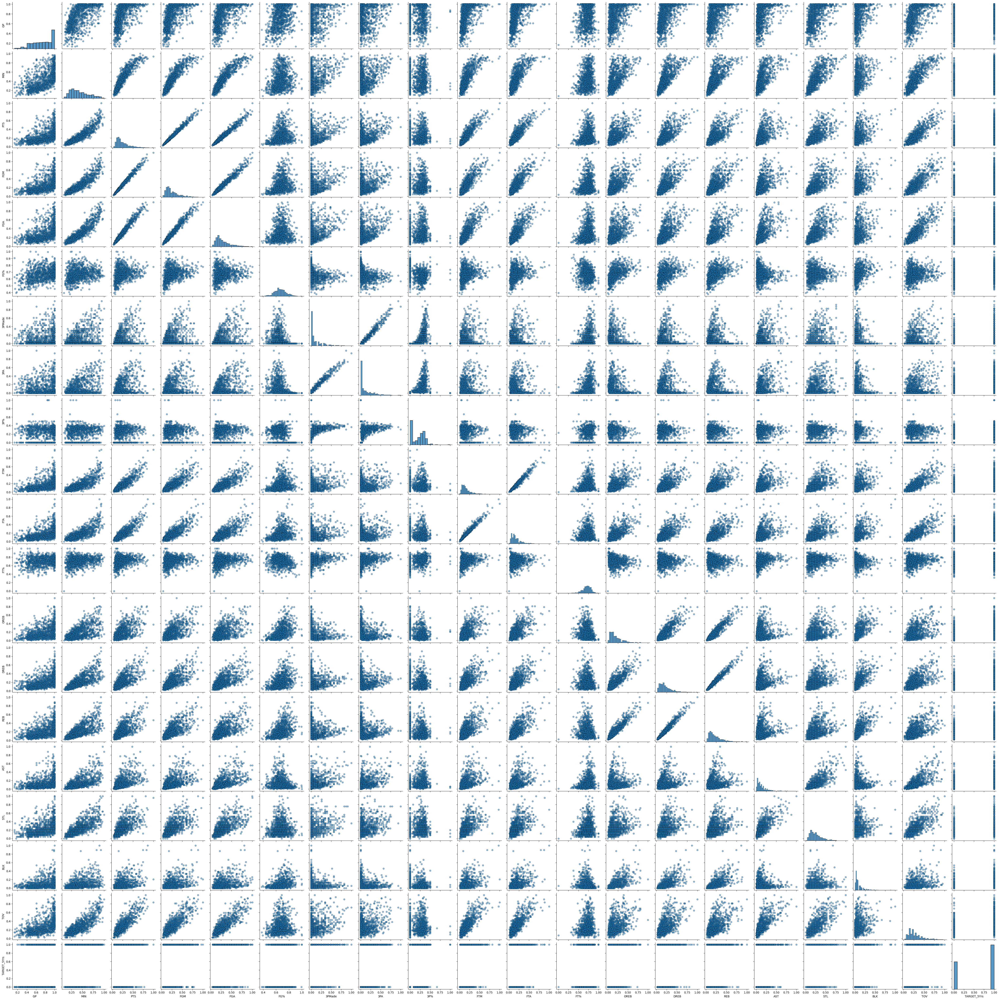

In [11]:
sns.pairplot(trainingData.iloc[0:-1], diag_kws={'edgecolor':'k'}, plot_kws={'alpha':0.5, 'edgecolor':'k'})

## K-Nearst Neighbors (KNN)

**Introdução:**

O algoritmo k-Nearest Neighbors (KNN) é um método de aprendizado de máquina amplamente utilizado para classificação e regressão. Baseado no princípio da proximidade, o KNN classifica novos pontos de dados com base na maioria das classes dos k vizinhos mais próximos no espaço de características.

Neste trabalho, empregaremos o algoritmo KNN para classificar a duração da carreira de jogadores da liga de basquete (NBA). Utilizando atributos específicos de cada jogador, buscaremos determinar se a carreira de um jogador durará pelo menos 5 anos na liga ou não. A fim de explorar a influência do parâmetro k no desempenho do modelo, testaremos o algoritmo com quatro valores distintos de k: 2, 10, 50 e 100. Já para ara avaliar a eficácia do modelo, examinaremos a matriz de confusão resultante de cada classificação e calcularemos métricas importantes, como acurácia, precisão, revocação (recall) e F1. Essas métricas fornecerão insights valiosos sobre a performance do modelo em relação à classificação da duração da carreira dos jogadores na NBA.

A análise dos resultados obtidos oferecerá uma compreensão mais aprofundada sobre como o parâmetro k influencia a capacidade do modelo KNN em prever a duração da carreira na liga de basquete, proporcionando um panorama do desempenho e da eficácia dessa abordagem de aprendizado de máquina para esse cenário específico.

### Implementação

Foi implementado pela criação de uma classe KNN, que possui os seguintes métodos:

    - __init__: inicializa o objeto com os parâmetros k e distância, que são os parâmetros do algoritmo.
    
    - predict: recebe um conjunto de dados de teste e retorna as predições para cada instância.

In [115]:
class KNN():
    def __init__(self, trainingData, testingData, k) -> None:
        self.k = k
        self.playersTrain = trainingData
        self.playersTest = testingData
        
    def predict(self, playersTest) -> list:
        knn_classifications = []
        for player in playersTest:
            distances = np.empty(shape=(len(self.playersTrain)), dtype=tuple)
            for j in range(len(self.playersTrain)):
                distances[j] = (self.playersTrain[j].distance(player),self.playersTrain[j].classification)
            distances = sorted(distances, key=lambda x: x[0])
            sum = 0
            for i in range(self.k):
                sum += distances[i][1]
            if(sum > self.k/2): knn_classifications.append(1)
            elif(sum < self.k/2): knn_classifications.append(0)
            else: knn_classifications.append(np.random.choice([0,1]))
        return knn_classifications

### Funções para rodar o modelo e plotar métricas


In [117]:
matrixs = []
accuracies = []
recalls = []
precisions = []
f1s = []

# Running the KNN algorithm
def runKNN(playersTrain, playersTest, k):
    knn = KNN(playersTrain, playersTest, k)
    knn_classifications = knn.predict(playersTest)
    accuracy = metrics.accuracy_score(real_classifications, knn_classifications)
    matrix = metrics.confusion_matrix(real_classifications, knn_classifications)
    recall = metrics.recall_score(real_classifications, knn_classifications)
    precision = metrics.precision_score(real_classifications, knn_classifications)
    f1 = metrics.f1_score(real_classifications, knn_classifications)
    accuracies.append(accuracy.__format__('.2f'))
    recalls.append(recall.__format__('.2f'))
    precisions.append(precision.__format__('.2f'))
    f1s.append(f1.__format__('.2f'))
    matrixs.append(matrix)

def plotKNN(accuracies, recalls, precisions, f1s, matrixs):
    figure = plt.figure(figsize=(10, 10), facecolor=('azure'))
    plot1 = plt.subplot2grid((3, 2), (0, 0), rowspan=1, colspan=2) 
    plot2 = plt.subplot2grid((3, 2), (1, 0), rowspan=1, colspan=1) 
    plot3 = plt.subplot2grid((3, 2), (1, 1), rowspan=1, colspan=1)
    plot4 = plt.subplot2grid((3, 2), (2, 0), rowspan=1, colspan=1)
    plot5 = plt.subplot2grid((3, 2), (2, 1), rowspan=1, colspan=1)

    plot1.set_title('Resultados obtidos pelo KNN', loc='center', pad=20)
    plot1.set_axis_off() 
    rcolors = plt.cm.Purples(np.full(4, 0.5))
    ccolors = plt.cm.Purples(np.full(4, 0.5))
    plot1.table(cellText=[accuracies, recalls, precisions, f1s], rowLabels=['Accuracy', 'Recall', 'Precision', 'F1'], colLabels=['K = 2', 'K = 10', 'K = 50', 'K = 150'], loc='center', rowColours=rcolors, rowLoc='center', colColours=ccolors)

    sns.heatmap(matrixs[0], ax=plot2, annot=True, fmt='d', cmap='Purples', linewidths=2, linecolor='black')
    plot2.set_title("Matriz de confusão K = 2") 
    sns.heatmap(matrixs[1], ax=plot3, annot=True, fmt='d', cmap='Purples', linewidths=2, linecolor='black')
    plot3.set_title("Matriz de confusão K = 10") 
    sns.heatmap(matrixs[2], ax=plot4, annot=True, fmt='d', cmap='Purples', linewidths=2, linecolor='black')
    plot4.set_title("Matriz de confusão K = 50") 
    sns.heatmap(matrixs[3], ax=plot5, annot=True, fmt='d', cmap='Purples', linewidths=2, linecolor='black')
    plot5.set_title("Matriz de confusão K = 150") 
    plt.show() 


### Resultados

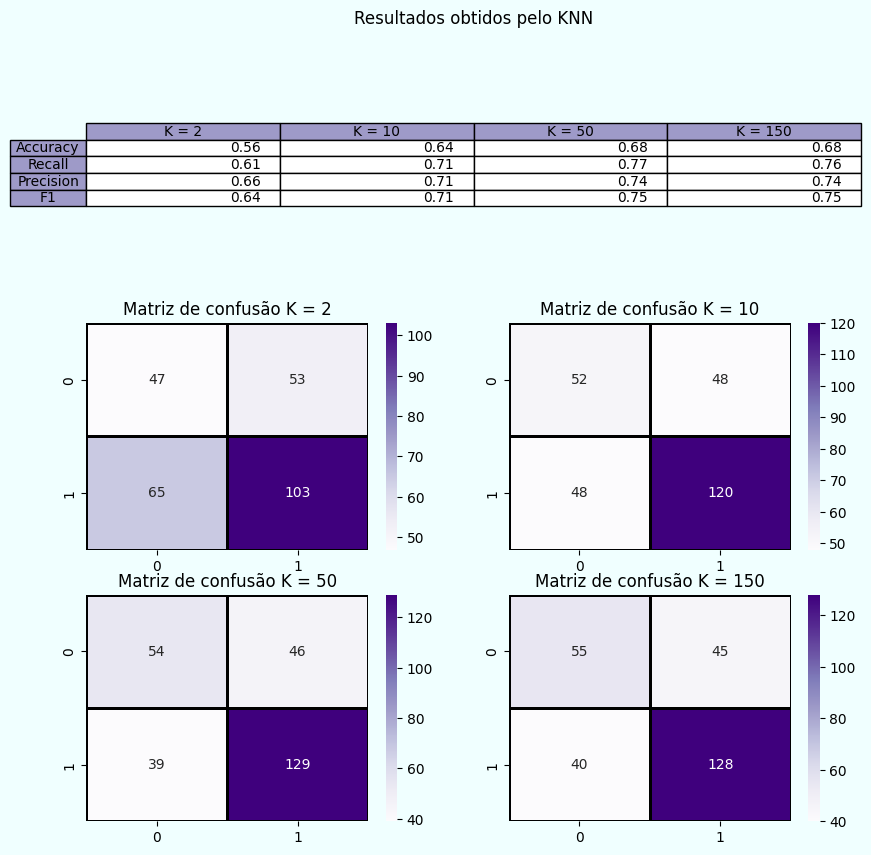

In [118]:
kValues = [2, 10, 50, 150]
for k in kValues:
    runKNN(playersTrain, playersTest, k)
plotKNN(accuracies, recalls, precisions, f1s, matrixs)

Os resultados obtidos com diferentes valores de k no algoritmo k-Nearest Neighbors (KNN) revelam a influência direta desse parâmetro no desempenho do modelo. Analisando os resultados fornecidos:

**K Pequeno (K = 2):**
Com k igual a 2, observamos uma acurácia relativamente baixa de 0.54. Isso sugere que o modelo está muito sensível a variações e ruídos nos dados, sendo altamente influenciado por pontos individuais ou discrepantes. Embora a precisão e o recall sejam moderados (0.65 e 0.58, respectivamente), o F1-Score é relativamente baixo (0.61), indicando um desempenho geral inferior.

**K Intermediário (K = 10):**
Ao aumentar k para 10, notamos uma melhoria na acurácia para 0.66. Este valor de k resulta em uma melhor distribuição entre precisão e recall, com valores de 0.72 e 0.76, respectivamente. Isso sugere que o modelo considera uma vizinhança mais ampla para tomar suas decisões, resultando em um desempenho mais equilibrado. O F1-Score aumentou para 0.74, indicando uma performance mais robusta.

**K Maior (K = 50 e K = 150):**
Aumentar ainda mais o valor de k para 50 e 150 resulta em uma acurácia ligeiramente melhorada (0.67 e 0.69, respectivamente). Embora haja uma estabilidade nas métricas de precisão e recall em torno de 0.73/0.76 (K = 50) e 0.74/0.76 (K = 150), o aumento no desempenho não é significativo em comparação com k = 10. Isso sugere que, embora o modelo continue considerando uma vizinhança mais ampla, o impacto na acurácia é limitado.

**Conclusão:**
- Com k pequeno, o modelo é mais sensível a ruídos e tende ao sobreajuste.
- Um k intermediário parece oferecer um melhor equilíbrio entre viés e variância, resultando em um desempenho mais equilibrado.
- Aumentar muito o valor de k pode reduzir a influência de pontos atípicos, mas pode limitar melhorias significativas na acurácia.

A escolha do valor ideal de k depende da natureza específica dos dados, procurando um equilíbrio entre capturar padrões significativos e evitar influências excessivas de ruído.

### Sklearn implementation

Agora, vamos comparar a implementação do KNN feita com a biblioteca sklearn com a versão do KNN implementada no trabalho.

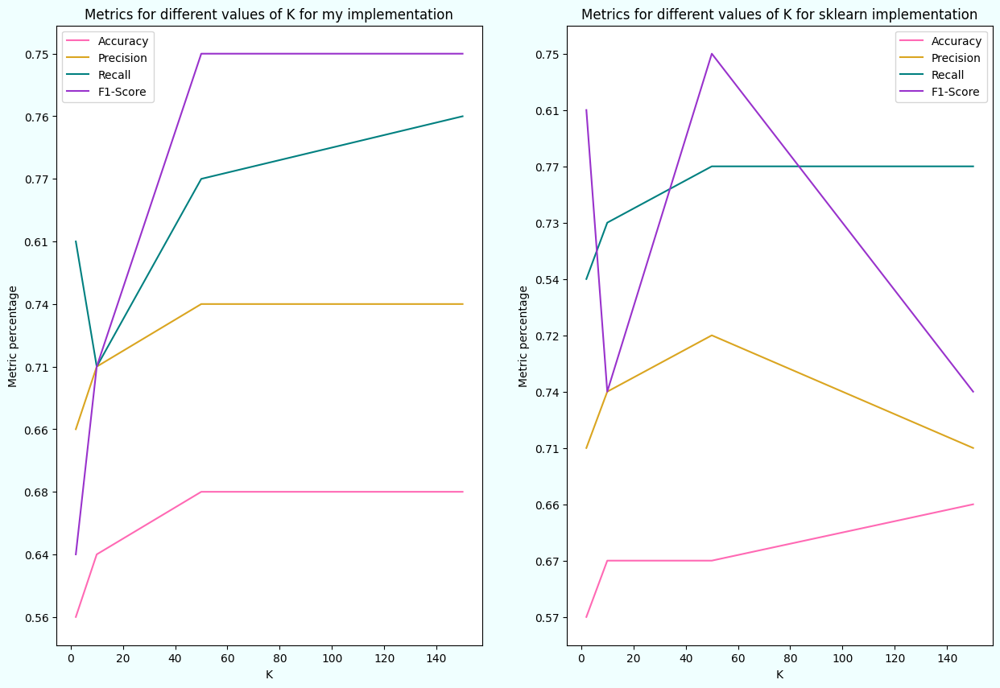

In [121]:
kValues = [2, 10, 50, 150]
accuracies_sklearn = []
precisions_sklearn = []
recalls_sklearn = []
f1_scores_sklearn = []

for k in kValues:
    knn = neighbors.KNeighborsClassifier(n_neighbors=k) 
    knn.fit(trainingData.drop(['TARGET_5Yrs'], axis=1).to_numpy(), trainingData['TARGET_5Yrs'].to_numpy())  # Train the KNN classifier using the train data
    predictions = knn.predict(testingData.drop(['TARGET_5Yrs'], axis=1).to_numpy())  # Make predictions on the test data

    accuracy = metrics.accuracy_score(real_classifications, predictions)
    recall = metrics.recall_score(real_classifications, predictions)
    precision = metrics.precision_score(real_classifications, predictions)
    f1 = metrics.f1_score(real_classifications, predictions)
    accuracies_sklearn.append(accuracy.__format__('.2f'))
    recalls_sklearn.append(recall.__format__('.2f'))
    precisions_sklearn.append(precision.__format__('.2f'))
    f1_scores_sklearn.append(f1.__format__('.2f'))

fig, axes = plt.subplots(1, 2, figsize=(15, 10), facecolor=('azure'))
axes[0].set_title('Metrics for different values of K for my implementation')
axes[0].set_xlabel('K')
axes[0].set_ylabel('Metric percentage')

axes[0].plot(kValues, accuracies, label='Accuracy', color='hotpink')
axes[0].plot(kValues, precisions, label='Precision', color='goldenrod')
axes[0].plot(kValues, recalls, label='Recall', color='teal')
axes[0].plot(kValues, f1s, label='F1-Score', color='darkorchid')

axes[1].set_title('Metrics for different values of K for sklearn implementation')
axes[1].set_xlabel('K')
axes[1].set_ylabel('Metric percentage')

axes[1].plot(kValues, accuracies_sklearn, label='Accuracy',  color='hotpink')
axes[1].plot(kValues, precisions_sklearn, label='Precision', color='goldenrod')
axes[1].plot(kValues, recalls_sklearn, label='Recall',  color='teal')
axes[1].plot(kValues, f1_scores_sklearn, label='F1-Score', color='darkorchid')

axes[0].legend()
axes[1].legend()
plt.show()

A implementação do K Nearest Neighbors utilizando a biblioteca scikit-learn produziu resultados muito semelhantes para as métricas Acurácia, Precisão, Recall e F1 Score, mantendo a mesma lógica em relação ao valor de k e o desempenho obtido pelo modelo.

## K-Means

**Introdução:**

O algoritmo k-Means é um método popular de aprendizado não supervisionado utilizado para agrupamento de dados. Seu objetivo é particionar um conjunto de dados em k clusters distintos, onde cada ponto de dados é atribuído a um cluster representado por seu centróide mais próximo.

Nesta etapa do trabalho, aplicaremos o algoritmo k-Means para agrupar os jogadores da NBA em conjuntos (clusters) distintos com base em seus atributos. É importante mencionar que não utilizaremos a coluna de resposta TARGET_5Yrs neste processo, ou seja, o algoritmo agrupará os jogadores apenas considerando suas características, sem a informação sobre a duração de suas carreiras.

Para explorar a influência do parâmetro k no agrupamento dos dados, testaremos o algoritmo com dois valores diferentes: k = 2 e k = 3. Após a execução do algoritmo, examinaremos os centróides de cada cluster obtido em ambos os casos.

Além disso, iremos analisar a relação entre os agrupamentos resultantes dos testes e os rótulos originais dos dados. Investigaremos se, por exemplo, com k = 2, o algoritmo é capaz de separar os jogadores de forma similar às duas classes de resposta originais. Também exploraremos o comportamento do algoritmo com k = 3, avaliando como ele agrupa os dados e se essa divisão se relaciona de alguma forma com os rótulos originais.

Esta análise detalhada dos resultados permitirá uma compreensão mais profunda do funcionamento do algoritmo k-Means e como ele organiza os jogadores da NBA em clusters distintos, fornecendo insights sobre a estrutura subjacente dos dados e sua possível relação com as classes de resposta originais.

### Implementação

In [122]:
np.random.seed(42) # For reproducibility

class KMeans():
    def __init__(self, trainingData, testingData, k) -> None:
        self.k = k
        self.trainingData = trainingData
        self.testingData = testingData
        self.clusters = dict()
        self.clusterPerInstance = np.empty(shape=(self.trainingData.shape[0]), dtype=int) # Array with the cluster index of each instance, to keep track of the changes
        self.converged = False
        
    def distance(self, element, cluster):
        return np.linalg.norm(element - cluster)

    # Assigns random centroids to each cluster
    def assign_centroids(self) -> dict:
        for idx in range(self.k):
            randomIndex = np.random.randint(0, self.trainingData.shape[0])
            cluster = {
                'center' : self.trainingData.iloc[randomIndex, 0:-1],
                'elements' : []
            }
            self.clusters[idx] = cluster
        
    # Assigns each instance to the cluster with the minimum distance
    def assign_clusters(self):
        updatedClusterPerInstance = np.empty(shape=(self.trainingData.shape[0]), dtype=int)
        for idx in range(self.trainingData.shape[0]): # For each instance
            dist = []
            for i in range(self.k): # For each cluster
                dis = self.distance(self.trainingData.iloc[idx, 0:-1], self.clusters[i]['center'])
                dist.append(dis)
            curr_cluster = np.argmin(dist) # Get the index of the cluster with the minimum distance
            self.clusters[curr_cluster]['elements'].append(self.trainingData.iloc[idx, 0:-1]) # Add the player to the cluster
            updatedClusterPerInstance[idx] = curr_cluster
        if np.array_equal(self.clusterPerInstance, updatedClusterPerInstance): # If the clusters didn't change, the algorithm has converged
            self.converged = True
        else:
            self.clusterPerInstance = updatedClusterPerInstance

    # Updates the centroids of each cluster
    def update_clusters(self):
        for i in range(self.k):
            elements = np.array(self.clusters[i]['elements'])
            if elements.shape[0] > 0: # If the cluster is not empty
                new_center = elements.mean(axis = 0) # Get the mean of the elements to be the new centroid
                self.clusters[i]['center'] = new_center
                self.clusters[i]['elements'] = []
                
    # Predicts the cluster of each player in the test dataset
    def pred_cluster(self):
        pred = []
        for i in range(self.testingData.shape[0]): # For each player
            dist = []
            for j in range(self.k): # For each cluster
                dist.append(self.distance(self.testingData.iloc[i, 0:-1], self.clusters[j]['center']))
            pred.append((np.argmin(dist), self.testingData.iloc[i, 0:-1]))
        return pred
    
    def fit(self):
        self.assign_centroids()
        self.assign_clusters()
        while not self.converged:
            self.update_clusters()
            self.assign_clusters()
        pred = self.pred_cluster()
        return self.clusters, pred

### Funções para rodar o modelo e plotar métricas

In [123]:
c = list()
p = list()
kValues = [2, 3]
def runKmeans():
    for k in kValues:
        kmeans = KMeans(trainingData, testingData, k)
        clusters, pred = kmeans.fit()
        c.append(clusters)
        p.append(pred)

In [124]:
def plotKmeansCluster(c,p, j, m):
    cluster1_x = []
    fig, ax = plt.subplots(1, 2, figsize=(10, 5), facecolor=('azure'))
    ax = ax.flatten()
    colors = ['pink', 'gold', 'paleturquoise']
    colors2 = ['hotpink', 'goldenrod', 'teal'] 
    ax[j].set_title(f'K-means com K = {m+2}')
    ax[1].set_title(f'Previsões')
    ax[j].set_xlabel('MIN')
    ax[j].set_ylabel('8P%')

    for k in range(len(c)):
        cluster1_x = []
        cluster1_y = []
        for i in range(len(c[k]['elements'])):
            cluster1_x.append(c[k]['elements'][i].iloc[1])
            cluster1_y.append(c[k]['elements'][i].iloc[8])
        
        ax[j].plot(cluster1_x, cluster1_y, 'o', markersize=3, label=f'Cluster {k}', color = colors[k])
        ax[j].plot(c[k]['center'][1], c[k]['center'][8], '*', markersize=10, label=f'Centroid {k}', markerfacecolor=colors2[k], markeredgewidth=2, markeredgecolor=colors2[k])
    
    for i in range(len(p[m])):
        ax[1].plot(p[m][i][1][1], p[m][i][1][8], 'o', markersize=3, label=f'Player {i}', color = colors[p[m][i][0]])
        
    
        
    

In [125]:
def plotDistance(c):
    cluster1_x = []
    clusters = c[0]
    fig, ax = plt.subplots(1, 2, figsize=(10, 5), facecolor=('azure'))
    ax = ax.flatten()
    for j in range(len(c)):
        
        ax[j].set_title(f'K-means com K = {j+2}')
        clusters = c[j]
        
        test = []

        for k in range(len(clusters)):
            test += clusters[k]['elements']

        dist1 = scipy.spatial.distance.cdist(test, test, metric='euclidean')
        ax[j].pcolormesh(dist1, cmap='Blues')
        fig.colorbar( ax[j].pcolormesh(dist1, cmap='Blues'), ax=ax[j])
        fig.show()

### Resultados

**PCA**

Como estamos lidandando com muitas variaveis e queremos visualizar os dados, vamos utilizar o PCA para reduzir a dimensionalidade dos dados para 2 dimensões.

In [126]:
pca_2 = decomposition.PCA(n_components=2)
pca_2_result = pca_2.fit_transform(trainingData)
print('Explained variation per principal component: {}'.format(pca_2.explained_variance_ratio_))
print('Cumulative variance explained by 2 principal components: {:.2%}'.format(np.sum(pca_2.explained_variance_ratio_)))
# Results from pca.components_
dataset_pca = pd.DataFrame(abs(pca_2.components_), columns=trainingData.columns, index=['PC_1', 'PC_2'])
print('\n\n', dataset_pca)

Explained variation per principal component: [0.48162262 0.22446432]
Cumulative variance explained by 2 principal components: 70.61%


             GP       MIN       PTS       FGM       FGA       FG%    3PMade  \
PC_1  0.245274  0.286523  0.217712  0.231055  0.247175  0.048494  0.069687   
PC_2  0.075198  0.275711  0.214907  0.223882  0.256436  0.004067  0.124846   

           3PA       3P%       FTM       FTA       FT%      OREB      DREB  \
PC_1  0.067122  0.026807  0.163730  0.164678  0.040161  0.146704  0.166294   
PC_2  0.133777  0.057613  0.156065  0.155163  0.024806  0.092765  0.139012   

           REB       AST       STL       BLK       TOV  TARGET_5Yrs  
PC_1  0.171133  0.118805  0.174144  0.079248  0.218475     0.671550  
PC_2  0.131389  0.127737  0.175776  0.049451  0.220298     0.725956  


**Olhando para os resultados do PCA fornecidos:**

- A variação explicada por cada componente principal é de aproximadamente 48.16% para o PC1 e 22.45% para o PC2. Juntas, essas duas componentes principais explicam cerca de 70.61% da variabilidade total nos dados.

- A contribuição de cada variável original para os componentes principais (PC1 e PC2) mostra como elas influenciam cada componente.


**Analisando os pesos (cargas) de cada variável nos componentes principais:**

- No PC1, vemos contribuições relativamente altas para variáveis como MIN (minutos jogados), FGA (tentativas de arremessos), TOV (perdas de bola), indicando que essas variáveis são importantes para essa dimensão principal.

- Já no PC2, variáveis como 3P% (percentual de conversão de arremessos de 3 pontos) e STL (roubos de bola) têm cargas mais altas, mostrando sua influência mais forte nessa dimensão.
Com base nesses resultados:

Vamos utilizar o PC1 e PC2 para visualizar os dados em 2 dimensões, plotando as variaveis MIN e 3P%.

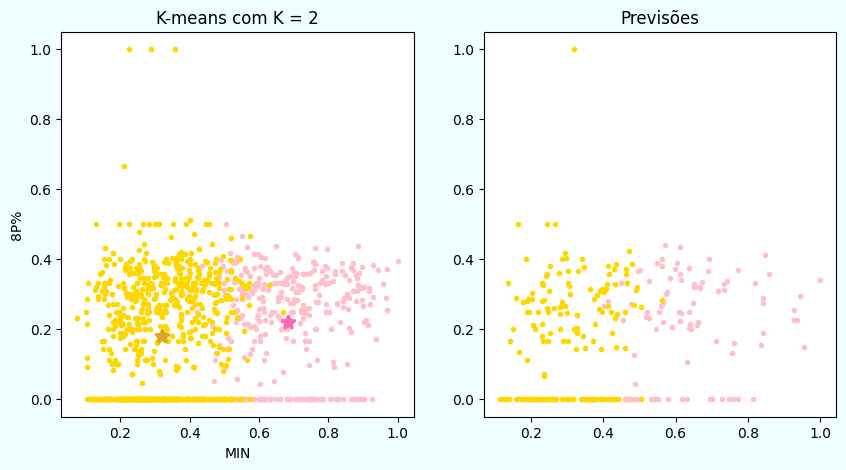

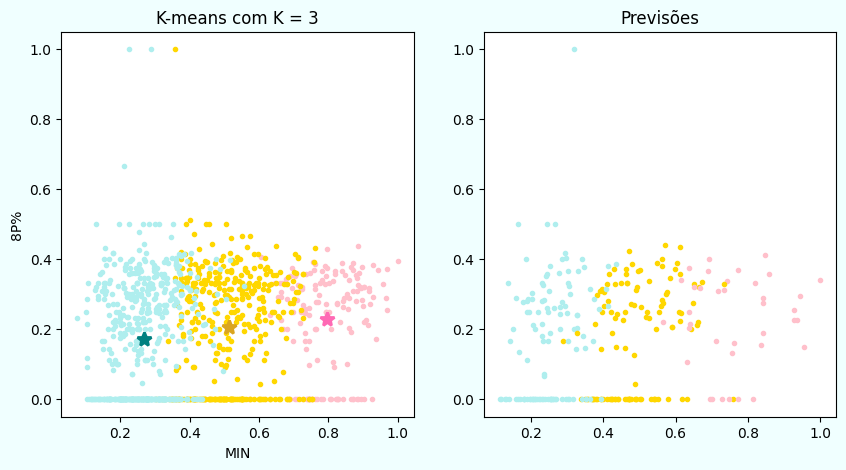

In [127]:
runKmeans()
plotKmeansCluster(c[0], p, 0, 0)
plotKmeansCluster(c[1], p, 0, 1)

O plot abaixo mostra a matriz de distância entre os pontos de dados, onde cada ponto representa um jogador. Podemos observar como os quadrados com distancia menor são mais claros, indicando que os pontos estão mais próximos, esses são os clusters achados pelo modelo K-means implementado.

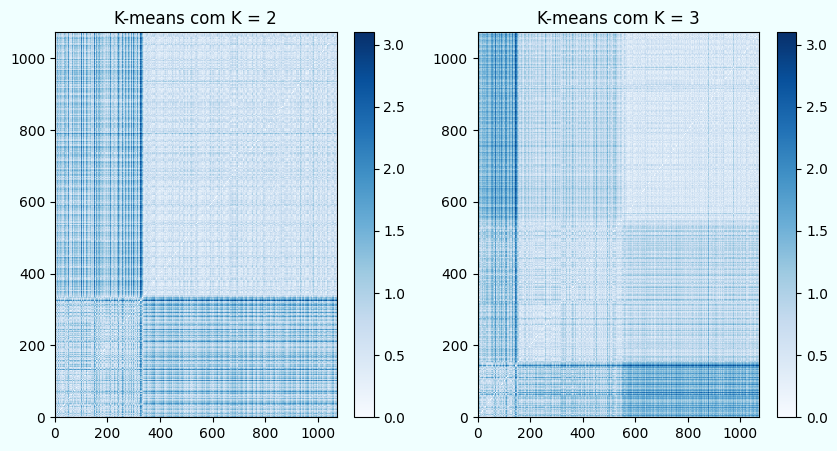

In [128]:
plotDistance(c)

**Resultados para k=2**:

Para este caso, o algoritmo K-Means identificou dois clusters distintos, cada um representado por um centróide. Estes centróides, localizados nas áreas de maior densidade de pontos de cada cluster, indicam as características médias dos jogadores em cada grupo. Com base nos dados de teste e na coluna TARGET_5Yrs, observamos que:

Cluster amarelo (104 jogadores): Representa os jogadores que permaneceram menos de 5 anos, uma identificação precisa, correspondendo à quantidade esperada de jogadores nesta categoria.
Cluster roxo (164 jogadores): Representa os jogadores que permaneceram mais de 5 anos, embora a separação não corresponda exatamente à distribuição original dos dados, o algoritmo ainda agrupou majoritariamente os jogadores corretamente.

**Resultados para k=3**:

Neste caso, o K-Means identificou três clusters bem definidos, cada um com seu próprio centróide. Essa adição de um terceiro cluster sugere uma divisão mais refinada dos jogadores em categorias adicionais de desempenho ou características. Com três clusters:
A separação entre os jogadores com desempenhos semelhantes é mais detalhada, o que pode levar a uma identificação mais precisa de padrões relacionados à permanência na liga.


A escolha entre k=2 e k=3 dependerá do objetivo da análise: k=2 para uma distinção mais genérica e k=3 (ou mais) para compreender variações mais sutis entre os jogadores.
Ambos os resultados indicam a capacidade do algoritmo K-Means em agrupar os jogadores, mas a escolha entre dois ou três clusters dependerá da profundidade desejada na análise das características dos jogadores e dos padrões de permanência na liga.





